# Анализ бизнес-показателей

## Описание проекта
Вас пригласили на стажировку в отдел маркетинговой аналитики Яндекс.Афиши. 
<br>Первое задание: помочь маркетологам снизить расходы — отказаться от невыгодных источников трафика и перераспределить бюджет.

Есть данные Яндекс.Афиши с июня 2017 по конец мая 2018 года:
- лог сервера с данными о посещениях сайта Яндекс.Афиши,
- выгрузка всех заказов за этот период,
- статистика рекламных расходов.


Вам предстоит изучить:
- как клиенты пользуются сервисом,
- когда делают первые покупки на сайте,
- сколько денег приносит компании каждый клиент,
- когда расходы на привлечение клиента окупаются.

Выручка измеряется в условных единицах — у.е.

## Описание данных

Файл `visits_log.csv` хранит лог сервера с информацией о посещениях сайта, `orders_log.csv` — информацию о заказах, а `costs.csv` — информацию о расходах на маркетинг.

Структура `visits_log.csv`
- *Uid* — уникальный идентификатор пользователя,
- *Device* — категория устройства пользователя,
- *Start Ts* — дата и время начала сессии,
- *End Ts* — дата и время окончания сессии,
- *Source Id* — идентификатор источника перехода на сайт.

Структура `orders_log.csv`
- *Uid* — уникальный идентификатор пользователя,
- *Buy Ts* — дата и время заказа,
- *Revenue* — сумма заказа.

Структура `costs.csv`
- *source_id* — идентификатор рекламного источника,
- *dt* — дата проведения рекламной кампании,
- *costs* — расходы на эту кампанию.

## Шаг 1. Загрузка и подготовка данных

In [1]:
# Импорт библиотеки
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Читаем файлы
visits = pd.read_csv('/datasets/visits_log.csv')
orders = pd.read_csv('/datasets/orders_log.csv')
costs = pd.read_csv('/datasets/costs.csv')

# Даем названия датасетам

visits.name, orders.name, costs.name = 'Визиты', 'Заказы', 'Расходы'

#Выводим общую информацию
list = [visits, orders, costs]
for df in list:
    print('Датасет:', df.name)
    display(df.head())
    print()
    print(df.info())
    print()

Датасет: Визиты


,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168




<class 'pandas.core.frame.DataFrame'>

RangeIndex: 359400 entries, 0 to 359399

Data columns (total 5 columns):

 #   Column     Non-Null Count   Dtype 

---  ------     --------------   ----- 

 0   Device     359400 non-null  object

 1   End Ts     359400 non-null  object

 2   Source Id  359400 non-null  int64 

 3   Start Ts   359400 non-null  object

 4   Uid        359400 non-null  uint64

dtypes: int64(1), object(3), uint64(1)

memory usage: 13.7+ MB

None



Датасет: Заказы


,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450




<class 'pandas.core.frame.DataFrame'>

RangeIndex: 50415 entries, 0 to 50414

Data columns (total 3 columns):

 #   Column   Non-Null Count  Dtype  

---  ------   --------------  -----  

 0   Buy Ts   50415 non-null  object 

 1   Revenue  50415 non-null  float64

 2   Uid      50415 non-null  uint64 

dtypes: float64(1), object(1), uint64(1)

memory usage: 1.2+ MB

None



Датасет: Расходы


,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08




<class 'pandas.core.frame.DataFrame'>

RangeIndex: 2542 entries, 0 to 2541

Data columns (total 3 columns):

 #   Column     Non-Null Count  Dtype  

---  ------     --------------  -----  

 0   source_id  2542 non-null   int64  

 1   dt         2542 non-null   object 

 2   costs      2542 non-null   float64

dtypes: float64(1), int64(1), object(1)

memory usage: 59.7+ KB

None




In [2]:
print ('\033[1m' + 'Датасет:', costs.name + '\033[0m')
costs.info()

Датасет: Расходы

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 2542 entries, 0 to 2541

Data columns (total 3 columns):

 #   Column     Non-Null Count  Dtype  

---  ------     --------------  -----  

 0   source_id  2542 non-null   int64  

 1   dt         2542 non-null   object 

 2   costs      2542 non-null   float64

dtypes: float64(1), int64(1), object(1)

memory usage: 59.7+ KB


Пропусков в данных нет. Поля с датами надо бы перевести в *datetime*

In [3]:
#переводим даты в datetime
visits['End Ts'] = pd.to_datetime(visits['End Ts'])
visits['Start Ts'] = pd.to_datetime(visits['Start Ts'])
visits.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 359400 entries, 0 to 359399

Data columns (total 5 columns):

 #   Column     Non-Null Count   Dtype         

---  ------     --------------   -----         

 0   Device     359400 non-null  object        

 1   End Ts     359400 non-null  datetime64[ns]

 2   Source Id  359400 non-null  int64         

 3   Start Ts   359400 non-null  datetime64[ns]

 4   Uid        359400 non-null  uint64        

dtypes: datetime64[ns](2), int64(1), object(1), uint64(1)

memory usage: 13.7+ MB


In [4]:
orders['Buy Ts'] = pd.to_datetime(orders['Buy Ts'])
orders.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 50415 entries, 0 to 50414

Data columns (total 3 columns):

 #   Column   Non-Null Count  Dtype         

---  ------   --------------  -----         

 0   Buy Ts   50415 non-null  datetime64[ns]

 1   Revenue  50415 non-null  float64       

 2   Uid      50415 non-null  uint64        

dtypes: datetime64[ns](1), float64(1), uint64(1)

memory usage: 1.2 MB


In [5]:
costs['dt'] = pd.to_datetime(costs['dt'])
costs.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 2542 entries, 0 to 2541

Data columns (total 3 columns):

 #   Column     Non-Null Count  Dtype         

---  ------     --------------  -----         

 0   source_id  2542 non-null   int64         

 1   dt         2542 non-null   datetime64[ns]

 2   costs      2542 non-null   float64       

dtypes: datetime64[ns](1), float64(1), int64(1)

memory usage: 59.7 KB


### Вывод
Данные загружены и подготовлены для дальнейшего анализа

__Поиск дубликатов__

In [6]:
#Проверка на дубликаты:
for df in list:
    print ('\033[1m' + 'Количество дубликатов в датасете:', df.name + '\033[0m')
    print(df.duplicated().sum())
    print()

Количество дубликатов в датасете: Визиты

0



Количество дубликатов в датасете: Заказы

0



Количество дубликатов в датасете: Расходы

0




Повезло, дубликатов не оказалось)

__Источники и типы устройств__

In [7]:
df_device = visits.groupby('Device').agg({'Uid':'count'})\
    .reset_index().rename(
    columns = {'Uid':'count'})
df_device['part'] = (df_device['count'] / df_device['count'].sum()).round(2) * 100
df_device

,Device,count,part
0,desktop,262567,73.0
1,touch,96833,27.0


Распределение устройств визита на сайт: ПК -  73%, телефон - 27%

In [8]:
df_source = visits.groupby('Source Id').agg({'Uid':'count'})\
    .reset_index().rename(
    columns = {'Uid':'count'})
df_source['part'] = (df_source['count'] / df_source['count'].sum()).round(2) * 100
df_source.sort_values(by='part', ascending = False)

,Source Id,count,part
3,4,101794,28.0
2,3,85610,24.0
4,5,66905,19.0
1,2,47626,13.0
0,1,34121,9.0
7,9,13277,4.0
8,10,10025,3.0
5,6,6,0.0
6,7,36,0.0


Визиты из истоников 6 и 7 практически не приносят вклада

Можно ещё посмотреть на сводную таблицу устройств и источников

In [9]:
df_device_source_pivot = visits.pivot_table(
    index='Device',
    columns='Source Id',
    values='Uid',
    aggfunc='count'
    )
df_device_source_pivot

Source Id,1,2,3,4,5,6,7,9,10
Device,,,,,,,,,
desktop,25901,35661,65777,67640,50069,5,28,10119,7367
touch,8220,11965,19833,34154,16836,1,8,3158,2658


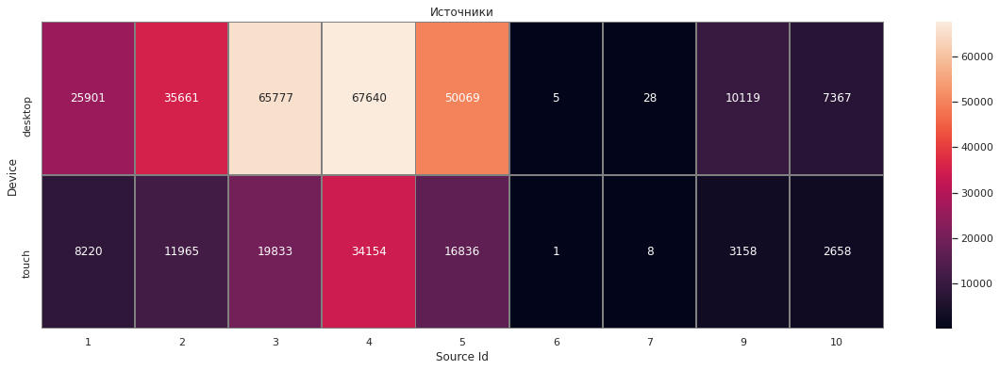

In [10]:
sns.set(style='white')
plt.figure(figsize=(20, 6))
plt.title('Источники')
sns.heatmap(df_device_source_pivot, annot=True, linewidths=1, linecolor='gray', fmt='d'); 

__Диапазоны дат__

In [11]:
print('Диапазон дат визита c', visits['Start Ts'].min(),' по',visits['Start Ts'].max())
print('Диапазон дат покупок c', orders['Buy Ts'].min(), ' по',orders['Buy Ts'].max())
print('Диапазон дат расходов c', costs['dt'].min(), ' по',costs['dt'].max())

Диапазон дат визита c 2017-06-01 00:01:00  по 2018-05-31 23:59:00

Диапазон дат покупок c 2017-06-01 00:10:00  по 2018-06-01 00:02:00

Диапазон дат расходов c 2017-06-01 00:00:00  по 2018-05-31 00:00:00


## Шаг 2. Рассчет метрик и построение графиков

### Продуктовые метрики

В таблице `visits` добавим столбцы: год, месяц, неделя и полная дата:

In [12]:
visits['session_year']  = visits['Start Ts'].dt.year
visits['session_month'] = visits['Start Ts'].dt.month
visits['session_month_name'] = visits['Start Ts'].dt.month_name()
visits['session_week']  = visits['Start Ts'].dt.week
visits['session_date'] = visits['Start Ts'].dt.date
visits.head(5)

/tmp/ipykernel_325/897454605.py:4: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.

  visits['session_week']  = visits['Start Ts'].dt.week


,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_month_name,session_week,session_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,December,51,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,February,8,2018-02-19
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,July,26,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,May,20,2018-05-20
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,December,52,2017-12-27


Рассчитаем `DAU`, `WAU` и `MAU`

#### Метрика DAU

Для рассчета среднего значения `DAU`, сгруппируем данные по дате активности и посчитаем уникальных пользователей

In [13]:
#Рассчитаем DAU, сгруппируем по дню сессии и посчитаем уникальных пользователей
dau = visits.groupby('session_date').agg({'Uid': 'nunique'}).reset_index().rename(columns={'Uid':'Uid_cnt'})

print('Среднее значение DAU за весь период:', int(dau['Uid_cnt'].mean()))

Среднее значение DAU за весь период: 907


Отобразим изменение дневной активности во времени на графике:

In [14]:
#Автоматизируем построение графика
import plotly.express as px
def Line_chart (df, col_1, col_2, title, x_title, y_title):
    
    fig = px.line(
        df, 
        x = col_1, 
        y = col_2, 
        title = title,
        )

    fig.update_layout(
        xaxis_title_text = x_title,
        yaxis_title_text = y_title
    )
    fig.show()

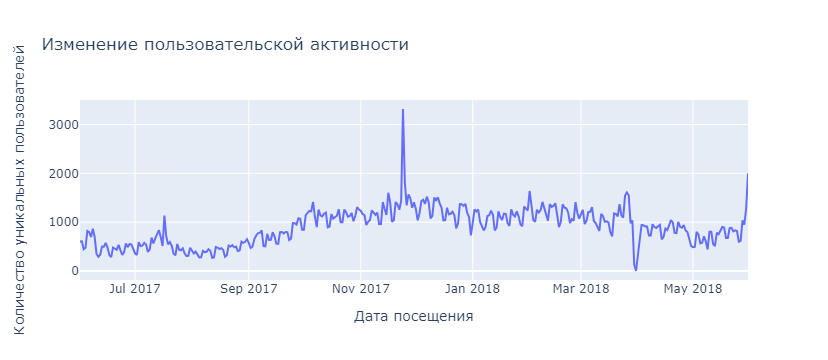

In [15]:
Line_chart (
    dau, 
    'session_date', 
    'Uid_cnt', 
    'Изменение пользовательской активности', 
    'Дата посещения',
    'Количество уникальных пользователей'
)

По графику изменения `DAU` можно заметить аномальные скачки уникальных пользователей: 
- 24 Ноября 2017 года - 3319 уникальных пользователей; 
- 31 Марта 2018 года - 1 пользователь.

Гугл подсказывает, что 24 ноября 2017 года -пятница, и в магазинах проходила "чёрная" пятница. Вероятно, что она и повлияла на эту аномалию

#### Метрика WAU

Для рассчета среднего значения `WAU`, сгруппируем данные по году и неделе, и посчитаем уникальных пользователей.

In [16]:
wau = visits.groupby(['session_year','session_week']).agg({'Uid': 'nunique'}).reset_index().rename(columns={'Uid':'Uid_cnt'})

print('Среднее значение WAU за весь период:', int(wau['Uid_cnt'].mean()))

Среднее значение WAU за весь период: 5716


Для построения графика недельной активности, разобьем данные на два периода - недели 2017 года и недели 2018 года

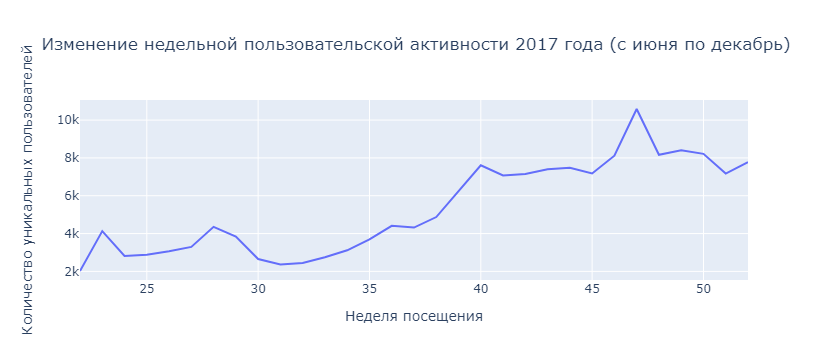

In [17]:
year_1 = 2017
year_2 = 2018

wau_2017 = wau.query('session_year == @year_1')
wau_2018 = wau.query('session_year == @year_2')

# График для недель 2017-го года

Line_chart (
    wau_2017, 
    'session_week', 
    'Uid_cnt', 
    'Изменение недельной пользовательской активности 2017 года (с июня по декабрь)', 
    'Неделя посещения',
    'Количество уникальных пользователей'
)

На графике замечается пик недельной активности:
 - 47-я неделя 2017 года (понедельник, 20 ноября 2017 — воскресенье, 26 ноября 2017)  - 10586.

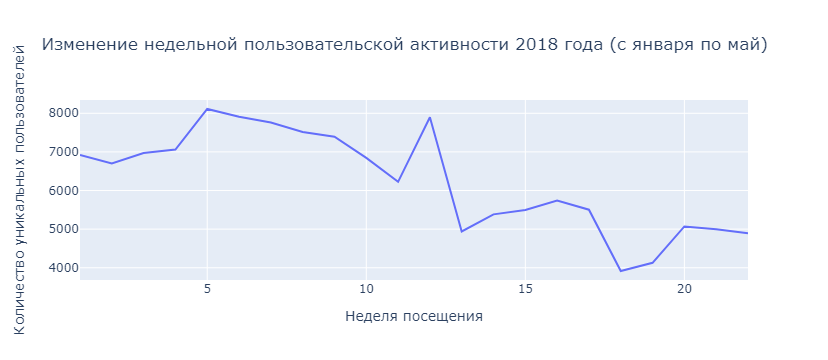

In [18]:
# График для недель 2018го года 

Line_chart (
    wau_2018, 
    'session_week', 
    'Uid_cnt', 
    'Изменение недельной пользовательской активности 2018 года (с января по май)', 
    'Неделя посещения',
    'Количество уникальных пользователей'
)

В 2018 году количество уникальных посетителей уменьшается, но можно выделить два пиковых значения:
 - 5я неделя 2018 года (понедельник, 29 января 2018 — воскресенье, 4 февраля 2018) - 8111;
 - 12 неделя 2018 года (понедельник, 19 марта 2018 — воскресенье, 25 марта 2018) - 7898
 
Самое минимальное значение:
- 18 неделя 2018 года (понедельник, 30 апреля 2018 — воскресенье, 6 мая 2018) - 3916

In [19]:
visits_copy = visits
visits_copy['session_week'] = visits_copy['session_date'].astype("datetime64[W]")
wau_2 = visits_copy.groupby('session_week').agg({'Uid': 'nunique'}).reset_index().rename(columns={'Uid':'Uid_cnt'})

print('Среднее значение WAU за весь период:', int(wau['Uid_cnt'].mean()))

Среднее значение WAU за весь период: 5716


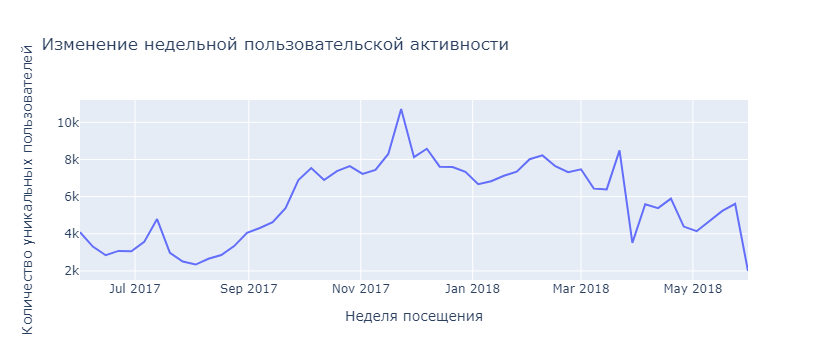

In [20]:
Line_chart (
    wau_2, 
    'session_week', 
    'Uid_cnt', 
    'Изменение недельной пользовательской активности', 
    'Неделя посещения',
    'Количество уникальных пользователей'
)

#### Метрика MAU

Для рассчета среднего значения `MAU`, сгруппируем данные по месяцу и посчитаем уникальных пользователей.

In [21]:
mau = visits.groupby(['session_year','session_month','session_month_name']).agg({'Uid': 'nunique'}).reset_index().rename(columns={'Uid':'Uid_cnt'})

print('Среднее значение MAU за весь период:', int(mau['Uid_cnt'].mean()))

Среднее значение MAU за весь период: 23228


In [22]:
mau

,session_year,session_month,session_month_name,Uid_cnt
0,2017,6,June,13259
1,2017,7,July,14183
2,2017,8,August,11631
3,2017,9,September,18975
4,2017,10,October,29692
5,2017,11,November,32797
6,2017,12,December,31557
7,2018,1,January,28716
8,2018,2,February,28749
9,2018,3,March,27473


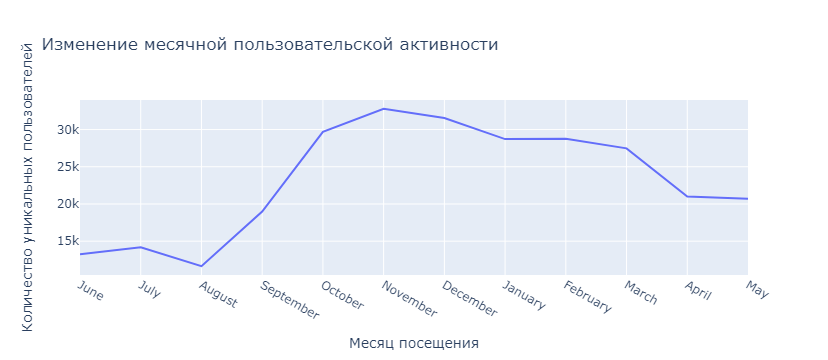

In [23]:
Line_chart (
    mau, 
    'session_month_name', 
    'Uid_cnt', 
    'Изменение месячной пользовательской активности', 
    'Месяц посещения',
    'Количество уникальных пользователей'
)

Летние месяцы самые непосещаемые. Рост числа  пользователей начинается после Августа. Пиковые месяцы - Октябрь, Ноябрь и Декабрь.

#### Количество посещений в день

In [24]:
visits_per_day = visits.groupby('session_date').agg({'Uid': 'count'}).reset_index().rename(columns={'Uid':'cnt'})
print('Среднее количество посещений в день:', int(visits_per_day['cnt'].mean()))

Среднее количество посещений в день: 987


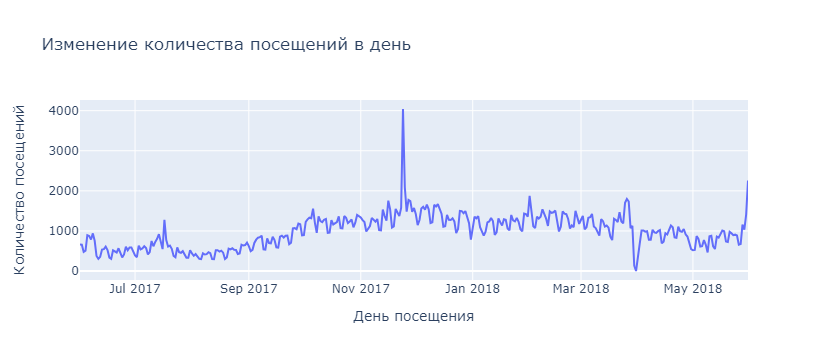

In [25]:
Line_chart (
    visits_per_day, 
    'session_date', 
    'cnt', 
    'Изменение количества посещений в день', 
    'День посещения',
    'Количество посещений'
)

В целом, график схож с графиком DAU

Посмотрим ещё на то, сколько сессий приходится на одного пользователя в месяц:

In [26]:
sessions_per_user = visits.groupby(['session_year', 'session_month']).agg({'Uid': ['count','nunique']})
sessions_per_user.columns = ['n_sessions', 'n_users']
sessions_per_user['sess_per_user'] = sessions_per_user['n_sessions'] / sessions_per_user['n_users']
sessions_per_user 

n_sessions  n_users  sess_per_user
session_year session_month                                    
2017         6                   16505    13259       1.244815
             7                   17828    14183       1.256998
             8                   14355    11631       1.234202
             9                   23907    18975       1.259921
             10                  37903    29692       1.276539
             11                  43969    32797       1.340641
             12                  41983    31557       1.330386
2018         1                   36939    28716       1.286356
             2                   37182    28749       1.293332
             3                   35679    27473       1.298693
             4                   26515    21008       1.262138
             5                   26635    20701       1.286653

In [27]:
print('В месяц один пользователь в среднем проводит {:.2f} сессии'.format(sessions_per_user['sess_per_user'].mean()))

В месяц один пользователь в среднем проводит 1.28 сессии


Получается, примерно, что один из четырех пользвателей заходит на сайт два раза в месяц

#### Средняя пользовательская сессия (ASL)

Рассчитаем среднюю длину пользовательской сессии

In [28]:
visits['session_duration_sec'] = (visits['End Ts'] - visits['Start Ts']).dt.seconds
print('Средняя длина пользовательской сессии {} секунд(а)'.format(int(visits['session_duration_sec'].mean()))) 

Средняя длина пользовательской сессии 643 секунд(а)


Построим распределение сессий

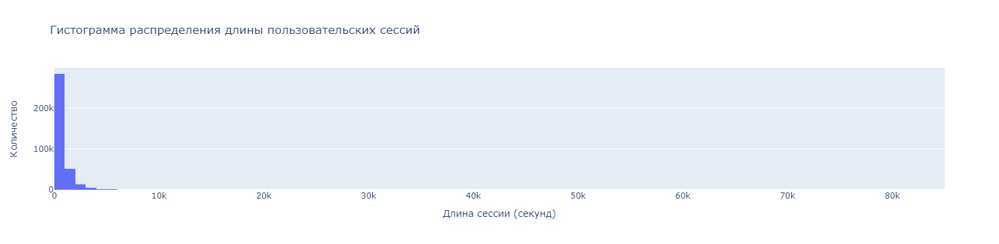

In [29]:
fig = px.histogram(
    visits, 
    x="session_duration_sec", 
    nbins=100,
    title='Гистограмма распределения длины пользовательских сессий'
)
fig.update_layout(
        xaxis_title_text = 'Длина сессии (секунд)',
        yaxis_title_text = 'Количество'
    )

fig.show()

Распределение не похоже на нормальное, поэтому рассчитаем моду распределения:

In [30]:
print('Наиболее часто встречаемое значение длины сессии {} секунд'.format(int(visits['session_duration_sec'].mode())))

Наиболее часто встречаемое значение длины сессии 60 секунд


In [31]:
visits_copy['session_duration_sec_1'] = (visits_copy['End Ts'] - visits_copy['Start Ts']).dt.seconds
print(visits_copy['session_duration_sec_1'].describe())

count    359400.000000

mean        643.506489

std        1016.334786

min           0.000000

25%         120.000000

50%         300.000000

75%         840.000000

max       84480.000000

Name: session_duration_sec_1, dtype: float64


In [32]:
visits_copy['session_duration_sec_2'] = (visits_copy['End Ts'] - visits_copy['Start Ts']).dt.total_seconds()
print(visits_copy['session_duration_sec_2'].describe())

count    359400.000000

mean        643.025687

std         997.127761

min       -2760.000000

25%         120.000000

50%         300.000000

75%         840.000000

max       42660.000000

Name: session_duration_sec_2, dtype: float64


Выходит, что в таблице визитов есть неточная информация о времени начала и окончания сессии, так как появились отрицательные значения секунд.

In [33]:
visits_copy.query('session_duration_sec_2 < 0')

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_month_name,session_week,session_date,session_duration_sec,session_duration_sec_1,session_duration_sec_2
4181,desktop,2018-03-25 03:18:00,3,2018-03-25 03:50:00,13092152539246794986,2018,3,March,2018-03-22,2018-03-25,84480,84480,-1920.0
177972,desktop,2018-03-25 03:09:00,9,2018-03-25 03:55:00,4621202742905035453,2018,3,March,2018-03-22,2018-03-25,83640,83640,-2760.0


#### Рассчет Retention Rate

Выделим когорты пользователей по дате первой активности по месяцам:

In [34]:
#Находим первый день активности пользователя
first_day_activity = visits.groupby('Uid')['session_date'].min()
first_day_activity.name = 'first_day_activity'

#Добавляем к визитам дату первой актвиности
visits = visits.join(first_day_activity, on='Uid')

visits['first_month_activity'] = visits['first_day_activity'].astype('datetime64[M]')
visits['month_activity'] = visits['session_date'].astype('datetime64[M]')
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_month_name,session_week,session_date,session_duration_sec,session_duration_sec_1,session_duration_sec_2,first_day_activity,first_month_activity,month_activity
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,December,2017-12-14,2017-12-20,1080,1080,1080.0,2017-12-20,2017-12-01,2017-12-01
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,February,2018-02-15,2018-02-19,1680,1680,1680.0,2018-02-19,2018-02-01,2018-02-01
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,July,2017-06-29,2017-07-01,0,0,0.0,2017-07-01,2017-07-01,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,May,2018-05-17,2018-05-20,1440,1440,1440.0,2018-03-09,2018-03-01,2018-05-01
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,December,2017-12-21,2017-12-27,0,0,0.0,2017-12-27,2017-12-01,2017-12-01


In [35]:
# Рассчитаем столбец cohort_lifetime
import numpy as np
visits_cohorts = visits.groupby(['first_month_activity', 'month_activity']
).agg({'Uid': 'nunique'})
visits_cohorts = visits_cohorts.reset_index()
visits_cohorts['cohort_lifetime'] = visits_cohorts['month_activity'] - visits_cohorts['first_month_activity']
visits_cohorts['cohort_lifetime'] = (visits_cohorts['cohort_lifetime'] / np.timedelta64(1, 'M')).round().astype('int')
visits_cohorts.head()

,first_month_activity,month_activity,Uid,cohort_lifetime
0,2017-06-01,2017-06-01,13259,0
1,2017-06-01,2017-07-01,1043,1
2,2017-06-01,2017-08-01,713,2
3,2017-06-01,2017-09-01,814,3
4,2017-06-01,2017-10-01,909,4


In [36]:
visits_pivot = visits_cohorts.pivot_table(
    index='first_month_activity',
    columns='cohort_lifetime',
    values='Uid',
    aggfunc='sum',
)
visits_pivot

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_month_activity,,,,,,,,,,,,
2017-06-01,13259.0,1043.0,713.0,814.0,909.0,947.0,809.0,766.0,694.0,674.0,539.0,596.0
2017-07-01,13140.0,737.0,674.0,738.0,765.0,633.0,596.0,601.0,510.0,376.0,361.0,NaN
2017-08-01,10181.0,783.0,640.0,639.0,510.0,448.0,370.0,402.0,284.0,265.0,NaN,NaN
2017-09-01,16704.0,1428.0,1156.0,847.0,658.0,632.0,599.0,404.0,381.0,NaN,NaN,NaN
2017-10-01,25977.0,2042.0,1357.0,1012.0,890.0,837.0,555.0,529.0,NaN,NaN,NaN,NaN
2017-11-01,27248.0,2133.0,1202.0,1054.0,919.0,638.0,594.0,NaN,NaN,NaN,NaN,NaN
2017-12-01,25268.0,1410.0,960.0,786.0,512.0,481.0,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,22624.0,1351.0,890.0,565.0,458.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,22197.0,1267.0,565.0,446.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Для рассчета `Retension Rate` найдем исходное количество пользователей

In [37]:
initial_users_count = visits_cohorts[visits_cohorts['cohort_lifetime'] == 0][['first_month_activity', 'Uid']].rename(columns={'Uid':'cohort_users'}) 
initial_users_count.head()

,first_month_activity,cohort_users
0,2017-06-01,13259
12,2017-07-01,13140
23,2017-08-01,10181
33,2017-09-01,16704
42,2017-10-01,25977


In [38]:
#Объединяем с таблицей visits_cohorts и добавляем столбец retension
visits_cohorts = visits_cohorts.merge(initial_users_count,on='first_month_activity')
visits_cohorts['retention'] = visits_cohorts['Uid']/visits_cohorts['cohort_users'] 
visits_cohorts.head()

,first_month_activity,month_activity,Uid,cohort_lifetime,cohort_users,retention
0,2017-06-01,2017-06-01,13259,0,13259,1.000000
1,2017-06-01,2017-07-01,1043,1,13259,0.078664
2,2017-06-01,2017-08-01,713,2,13259,0.053775
3,2017-06-01,2017-09-01,814,3,13259,0.061392
4,2017-06-01,2017-10-01,909,4,13259,0.068557


Строим сводную таблицу

In [39]:
retention_pivot = visits_cohorts.pivot_table(
    index='first_month_activity',
    columns='cohort_lifetime',
    values='retention',
    aggfunc='sum',
) 
retention_pivot

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_month_activity,,,,,,,,,,,,
2017-06-01,1.0,0.078664,0.053775,0.061392,0.068557,0.071423,0.061015,0.057772,0.052342,0.050833,0.040652,0.044951
2017-07-01,1.0,0.056088,0.051294,0.056164,0.058219,0.048174,0.045358,0.045738,0.038813,0.028615,0.027473,NaN
2017-08-01,1.0,0.076908,0.062862,0.062764,0.050093,0.044004,0.036342,0.039485,0.027895,0.026029,NaN,NaN
2017-09-01,1.0,0.085489,0.069205,0.050706,0.039392,0.037835,0.035860,0.024186,0.022809,NaN,NaN,NaN
2017-10-01,1.0,0.078608,0.052239,0.038958,0.034261,0.032221,0.021365,0.020364,NaN,NaN,NaN,NaN
2017-11-01,1.0,0.078281,0.044113,0.038682,0.033727,0.023415,0.021800,NaN,NaN,NaN,NaN,NaN
2017-12-01,1.0,0.055802,0.037993,0.031107,0.020263,0.019036,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,1.0,0.059715,0.039339,0.024973,0.020244,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,1.0,0.057080,0.025454,0.020093,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Построим тепловую карту

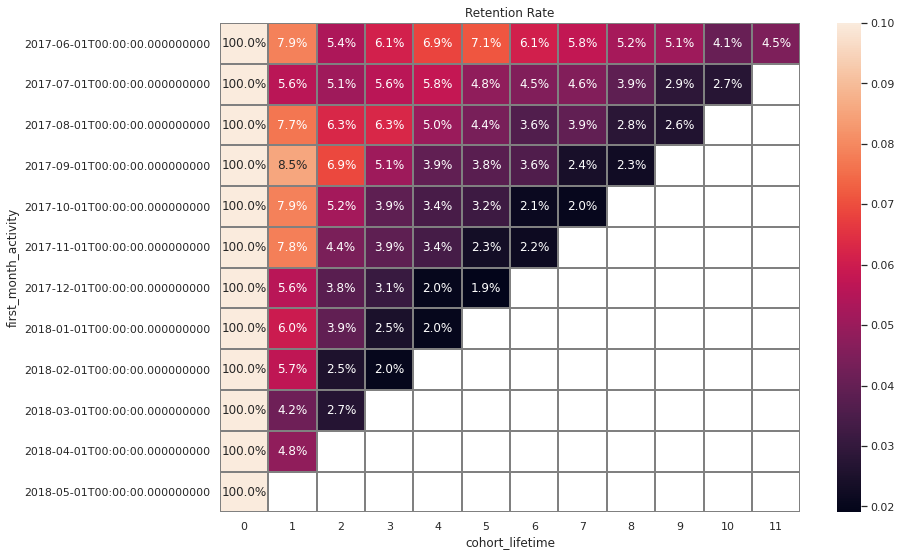

In [40]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Retention Rate')
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray', vmax=0.1); 

Для всех когорт Retention rate очень мал.

In [41]:
mean_retetion_2 = visits_cohorts[visits_cohorts['cohort_lifetime'] == 2]['retention'].mean()
print('Средний Retention Rate на второй месяц «жизни» когорт: {:.2%}'.format(mean_retetion_2))

Средний Retention Rate на второй месяц «жизни» когорт: 4.63%


### Метрики электронной коммерции

#### Среднее время покупки с момента первого посещения

In [42]:
first_session_date = visits.groupby('Uid')['Start Ts'].min().reset_index()
first_order_date = orders.groupby('Uid')['Buy Ts'].min().reset_index()
first_session_order = first_session_date.merge(first_order_date, on='Uid', how='right')
first_session_order['time_from_session_to_order'] = (first_session_order['Buy Ts'] - first_session_order['Start Ts']).dt.seconds
print ('Среднее время с момента первого посещения до первой покупки: {:.2f} ч.'.format(first_session_order['time_from_session_to_order'].mean()/60/60))

Среднее время с момента первого посещения до первой покупки: 4.15 ч.


In [43]:
#Если посмотреть моду распределения:
print ('Наиболее часто встречаемое время от первого посещения до покупки:', int(first_session_order['time_from_session_to_order'].mode()))

Наиболее часто встречаемое время от первого посещения до покупки: 60


In [44]:
orders_copy = orders
first_session_date_2 = visits_copy.groupby('Uid')['Start Ts'].min().reset_index()
first_order_date_2 = orders_copy.groupby('Uid')['Buy Ts'].min().reset_index()
first_session_order_2 = first_session_date_2.merge(first_order_date_2, on='Uid', how='right')
first_session_order_2['time_from_session_to_order'] = (first_session_order_2['Buy Ts'] - first_session_order_2['Start Ts']).dt.total_seconds()
print ('Среднее время с момента первого посещения до первой покупки: {:.2f} ч.'.format(first_session_order_2['time_from_session_to_order'].mean()/60/60))

Среднее время с момента первого посещения до первой покупки: 405.67 ч.


Внезапно среднее время оказалось под 405 часов...Открыл вкладку, купил спустя 17 дней.

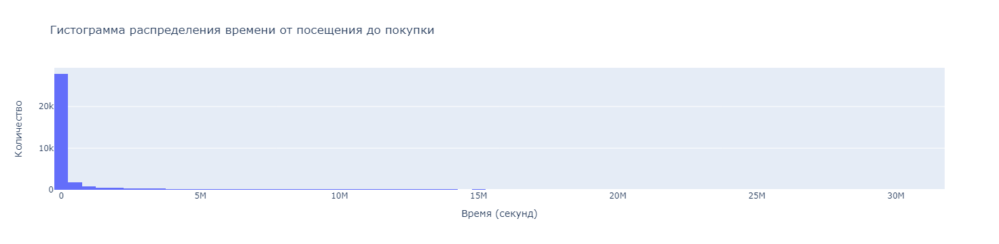

In [45]:
fig = px.histogram(
    first_session_order_2, 
    x="time_from_session_to_order", 
    nbins=100,
    title='Гистограмма распределения времени от посещения до покупки'
)
fig.update_layout(
        xaxis_title_text = 'Время (секунд)',
        yaxis_title_text = 'Количество'
    )

fig.show()

In [46]:
print ('Наиболее часто встречаемое время от первого посещения до покупки:', int(first_session_order_2['time_from_session_to_order'].mode()))

Наиболее часто встречаемое время от первого посещения до покупки: 60


#### Среднее количество покупок

In [47]:
orders['month'] = orders['Buy Ts'].astype('datetime64[M]')
first_orders = orders.groupby('Uid')['month'].min().reset_index()
first_orders.columns = ['Uid', 'first_order']
new_orders = pd.merge(orders,first_orders, on = 'Uid')
purchases_grouped_by_cohorts = new_orders.groupby(['first_order', 'month']).agg(
    {'Revenue':'count',
    'Uid':'nunique'})
purchases_grouped_by_cohorts['purchases_per_user'] = purchases_grouped_by_cohorts['Revenue'] / purchases_grouped_by_cohorts['Uid']
mean_purchases_pivot  = purchases_grouped_by_cohorts.pivot_table(index='first_order',
                                                                 columns = 'month',
                                                                values = 'purchases_per_user', aggfunc='sum')
mean_purchases_pivot
print('Среднее количество покупок за 6 месяцев:', int(mean_purchases_pivot.cumsum(axis=1).mean(axis=1)[5]))
mean_purchases_pivot

Среднее количество покупок за 6 месяцев: 6


month,2017-06-01,2017-07-01,2017-08-01,2017-09-01,2017-10-01,2017-11-01,2017-12-01,2018-01-01,2018-02-01,2018-03-01,2018-04-01,2018-05-01,2018-06-01
first_order,,,,,,,,,,,,,
2017-06-01,1.163618,2.901639,3.480000,4.185185,3.318182,3.253731,4.451613,3.702128,3.655172,3.400000,2.133333,1.622642,NaN
2017-07-01,NaN,1.136765,1.923077,2.105263,1.625000,1.469388,2.157895,1.694444,1.282051,1.380952,1.090909,2.038462,NaN
2017-08-01,NaN,NaN,1.118978,1.862069,1.886792,1.840909,2.125000,1.937500,1.633333,1.772727,2.421053,1.483871,NaN
2017-09-01,NaN,NaN,NaN,1.136381,1.684615,1.610000,2.216216,1.288462,1.703125,1.636364,1.513514,1.418605,NaN
2017-10-01,NaN,NaN,NaN,NaN,1.143779,1.524272,1.317073,1.326087,1.387097,1.430556,1.535714,1.865672,NaN
2017-11-01,NaN,NaN,NaN,NaN,NaN,1.179368,1.788288,1.516667,1.990566,1.679012,1.229167,1.645161,NaN
2017-12-01,NaN,NaN,NaN,NaN,NaN,NaN,1.152635,1.849315,1.961165,1.845361,1.720000,1.666667,NaN
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.121554,1.964912,1.915663,1.488372,1.733333,NaN
2018-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.121611,1.881356,1.431034,1.794872,NaN


#### Средний чек

In [48]:
orders['purchase_date'] = orders['Buy Ts'].dt.date
orders.head()

,Buy Ts,Revenue,Uid,month,purchase_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-06-01


In [49]:
#Считаем общую сумму заказа за день, количество заказов
mean_purchase_per_day = orders.groupby(
    'purchase_date').agg({'Revenue': 'sum','Uid':'nunique'}).reset_index().rename(
    columns={'Revenue':'r_sum','Uid':'n_buyers'})
#Средний чек за день
mean_purchase_per_day['r_mean'] = (mean_purchase_per_day['r_sum'] / mean_purchase_per_day['n_buyers']).round(2)
mean_purchase_per_day.head()

,purchase_date,r_sum,n_buyers,r_mean
0,2017-06-01,389.46,86,4.53
1,2017-06-02,324.11,101,3.21
2,2017-06-03,166.48,61,2.73
3,2017-06-04,195.21,59,3.31
4,2017-06-05,441.49,146,3.02


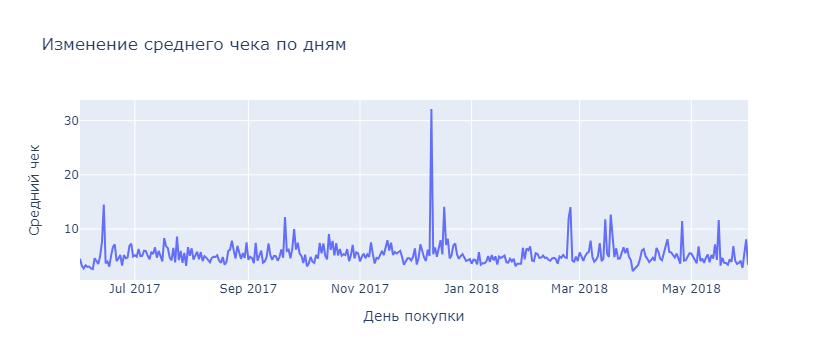

In [50]:
Line_chart (
    mean_purchase_per_day, 
    'purchase_date', 
    'r_mean', 
    'Изменение среднего чека по дням', 
    'День покупки',
    'Средний чек'
)

In [51]:
#Считаем общую сумму заказа за месяц, количество заказов
mean_purchase_per_month = orders.groupby(
    'month').agg({'Revenue': 'sum','Uid':'nunique'}).reset_index().rename(
    columns={'Revenue':'r_sum','Uid':'n_buyers'})
#Средний чек за день
mean_purchase_per_month['r_mean'] = (mean_purchase_per_month['r_sum'] / mean_purchase_per_month['n_buyers']).round(2)
mean_purchase_per_month

,month,r_sum,n_buyers,r_mean
0,2017-06-01,9557.49,2023,4.72
1,2017-07-01,12539.47,1984,6.32
2,2017-08-01,8758.78,1472,5.95
3,2017-09-01,18345.51,2750,6.67
4,2017-10-01,27987.70,4675,5.99
5,2017-11-01,27069.93,4547,5.95
6,2017-12-01,36388.60,4942,7.36
7,2018-01-01,19417.13,3898,4.98
8,2018-02-01,25560.54,4258,6.00
9,2018-03-01,28834.59,4181,6.90


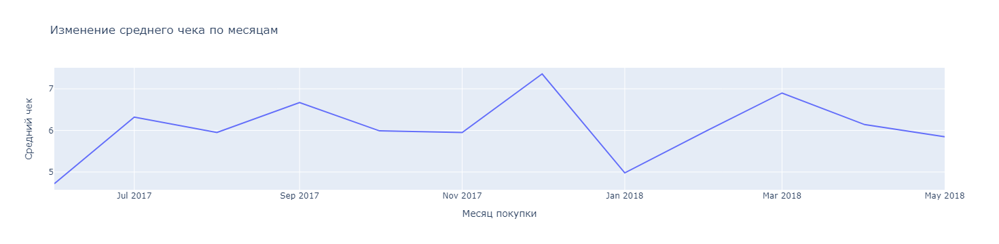

In [52]:
Line_chart (
    mean_purchase_per_month.query('n_buyers > 1'), 
    'month', 
    'r_mean', 
    'Изменение среднего чека по месяцам', 
    'Месяц покупки',
    'Средний чек'
)

Первые месяцы сезонов наблюдается пик: Сентябрь, Декабрь и Март. Летние месяцы не особо удачные. Возможно люди проводят время в отпусках. В январе наблюдается резкий скачок среднего чека вниз и к марту доходит до пика. Возможно, зимой люди реже выходят на мероприятия и активизурются с приходом весны

#### LTV

In [53]:
#Вернемся к таблице заказов с добавленной колонкой датой первой покупки
new_orders.head()

,Buy Ts,Revenue,Uid,month,first_order
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-06-01


In [54]:
cohorts = (
    new_orders.groupby(['first_order', 'month'])
    .agg({'Revenue': 'sum'})
    .reset_index()
)
cohorts.head()

,first_order,month,Revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58


In [55]:
cohort_sizes = (
    first_orders.groupby('first_order')
    .agg({'Uid': 'nunique'})
    .reset_index()
)
cohort_sizes.columns = ['first_order', 'n_buyers']
cohort_sizes.head()

,first_order,n_buyers
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340


In [56]:
report = pd.merge(cohort_sizes, cohorts, on='first_order')
report.head()

,first_order,n_buyers,month,Revenue
0,2017-06-01,2023,2017-06-01,9557.49
1,2017-06-01,2023,2017-07-01,981.82
2,2017-06-01,2023,2017-08-01,885.34
3,2017-06-01,2023,2017-09-01,1931.30
4,2017-06-01,2023,2017-10-01,2068.58


In [57]:
margin_rate = 1

report['gp'] = report['Revenue'] * margin_rate

report['age'] = (
    report['month'] - report['first_order']
) / np.timedelta64(1, 'M')

report['age'] = report['age'].round().astype('int')

report['ltv'] = report['gp'] / report['n_buyers']

output_LTV = report.pivot_table(
    index='first_order', columns='age', values='ltv', aggfunc='mean'
).round(3)

output_LTV.fillna('') 

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order,,,,,,,,,,,,
2017-06-01,4.724,0.485,0.438,0.955,1.023,0.736,0.95,0.582,0.553,0.606,0.571,0.257
2017-07-01,6.010,0.335,0.624,0.359,0.177,0.156,0.12,0.142,0.161,0.147,0.156,
2017-08-01,5.277,0.472,0.458,0.391,0.494,0.284,0.211,0.405,0.292,0.188,,
2017-09-01,5.645,1.118,0.521,3.976,0.401,0.647,0.702,0.243,0.184,,,
2017-10-01,5.004,0.536,0.191,0.157,0.152,0.12,0.085,0.115,,,,
2017-11-01,5.155,0.399,0.2,0.325,0.148,0.054,0.115,,,,,
2017-12-01,4.738,0.26,0.925,1.065,0.313,0.338,,,,,,
2018-01-01,4.136,0.295,0.304,0.143,0.063,,,,,,,
2018-02-01,4.157,0.278,0.079,0.074,,,,,,,,


In [58]:
for x in output_LTV.index:
    print(f'Итоговый LTV когорты {x}'.split('00:')[0], output_LTV.loc[x].sum())

Итоговый LTV когорты 2017-06-01  11.88

Итоговый LTV когорты 2017-07-01  8.387

Итоговый LTV когорты 2017-08-01  8.472000000000001

Итоговый LTV когорты 2017-09-01  13.437

Итоговый LTV когорты 2017-10-01  6.359999999999999

Итоговый LTV когорты 2017-11-01  6.396000000000001

Итоговый LTV когорты 2017-12-01  7.639

Итоговый LTV когорты 2018-01-01  4.941

Итоговый LTV когорты 2018-02-01  4.588

Итоговый LTV когорты 2018-03-01  5.456

Итоговый LTV когорты 2018-04-01  5.19

Итоговый LTV когорты 2018-05-01  4.661

Итоговый LTV когорты 2018-06-01  3.42


In [59]:
print('Средний LTV за 6 месяцев = ',output_LTV.cumsum(axis=1).mean(axis=0)[5])

Средний LTV за 6 месяцев =  7.969428571428572


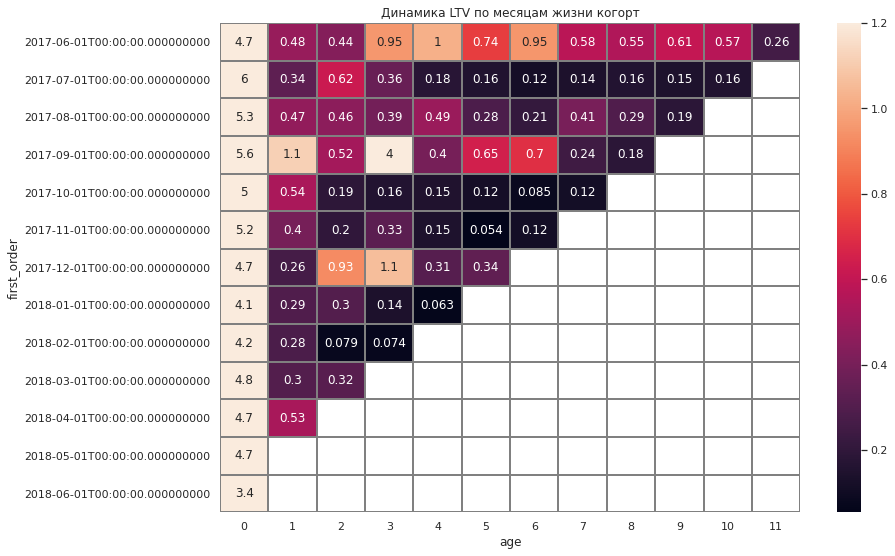

In [60]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Динамика LTV по месяцам жизни когорт')
sns.heatmap(output_LTV, annot=True, linewidths=1, linecolor='gray', vmax=1.2); 

Лучше всех показала себя когорта Сентября, она успела обойти по LTV Июньскую когорту.

В целом, можно выделить 3 когорты: Июнь, Сентябрь и Декабрь.

In [61]:
#Накопительный LTV
output_LTV.cumsum(axis=1).fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order,,,,,,,,,,,,
2017-06-01,4.724,5.209,5.647,6.602,7.625,8.361,9.311,9.893,10.446,11.052,11.623,11.88
2017-07-01,6.010,6.345,6.969,7.328,7.505,7.661,7.781,7.923,8.084,8.231,8.387,
2017-08-01,5.277,5.749,6.207,6.598,7.092,7.376,7.587,7.992,8.284,8.472,,
2017-09-01,5.645,6.763,7.284,11.26,11.661,12.308,13.01,13.253,13.437,,,
2017-10-01,5.004,5.54,5.731,5.888,6.04,6.16,6.245,6.36,,,,
2017-11-01,5.155,5.554,5.754,6.079,6.227,6.281,6.396,,,,,
2017-12-01,4.738,4.998,5.923,6.988,7.301,7.639,,,,,,
2018-01-01,4.136,4.431,4.735,4.878,4.941,,,,,,,
2018-02-01,4.157,4.435,4.514,4.588,,,,,,,,


### Маркетинговые метрики

#### Общая сумма на маркетинг

In [62]:
#Выделяем месяц 
costs['month'] = costs['dt'].astype('datetime64[M]')

#группируем по месяцу и источнику
costs_grouped = costs.groupby(['month','source_id'])['costs'].sum().reset_index()
costs_grouped.head(10)

,month,source_id,costs
0,2017-06-01,1,1125.61
1,2017-06-01,2,2427.38
2,2017-06-01,3,7731.65
3,2017-06-01,4,3514.80
4,2017-06-01,5,2616.12
5,2017-06-01,9,285.22
6,2017-06-01,10,314.22
7,2017-07-01,1,1072.88
8,2017-07-01,2,2333.11
9,2017-07-01,3,7674.37


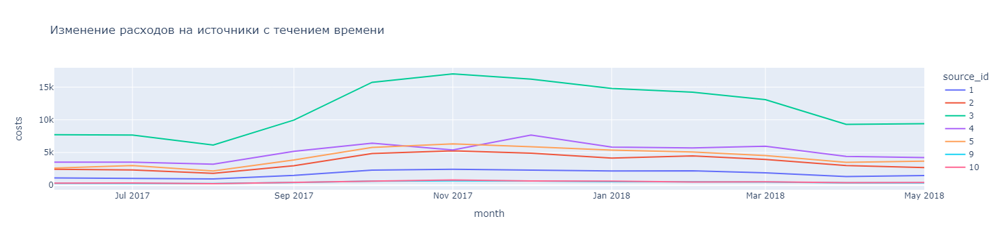

In [63]:
px.line(costs_grouped, x = 'month', y = 'costs', color='source_id', title='Изменение расходов на источники с течением времени')

In [64]:
costs_by_source= costs.groupby('source_id').agg({'costs': 'sum'})
costs_by_source.sort_values(by='costs', ascending=False)

,costs
source_id,
3,141321.63
4,61073.60
5,51757.10
2,42806.04
1,20833.27
10,5822.49
9,5517.49


Самый затратный источник - источник 3.

In [65]:
print('Общие затраты на рекламу по всем источникам:',costs_by_source['costs'].sum())

Общие затраты на рекламу по всем источникам: 329131.6199999999


#### Стоимость привлечения одного клиента

In [66]:
# считаем расходы за месяц
costs['month'] = costs['dt'].astype('datetime64[M]')
monthly_costs = costs.groupby('month')['costs'].sum().reset_index()
monthly_costs.columns = ['month', 'costs']
monthly_costs

,month,costs
0,2017-06-01,18015.00
1,2017-07-01,18240.59
2,2017-08-01,14790.54
3,2017-09-01,24368.91
4,2017-10-01,36322.88
5,2017-11-01,37907.88
6,2017-12-01,38315.35
7,2018-01-01,33518.52
8,2018-02-01,32723.03
9,2018-03-01,30415.27


In [67]:
report_new = pd.merge(
    report, monthly_costs, on='month')
report_new['cac'] = report_new['costs'] / report_new['n_buyers']
report_new['romi'] = report_new['ltv'] / report_new['cac']
report_new

,first_order,n_buyers,month,Revenue,gp,age,ltv,costs,cac,romi
0,2017-06-01,2023,2017-06-01,9557.49,9557.49,0,4.724414,18015.00,8.905091,0.530530
1,2017-06-01,2023,2017-07-01,981.82,981.82,1,0.485329,18240.59,9.016604,0.053826
2,2017-07-01,1923,2017-07-01,11557.65,11557.65,0,6.010218,18240.59,9.485486,0.633623
3,2017-06-01,2023,2017-08-01,885.34,885.34,2,0.437637,14790.54,7.311191,0.059859
4,2017-07-01,1923,2017-08-01,644.61,644.61,1,0.335211,14790.54,7.691388,0.043583
...,...,...,...,...,...,...,...,...,...,...
73,2018-01-01,3373,2018-05-01,211.48,211.48,4,0.062698,22224.27,6.588873,0.009516
74,2018-02-01,3651,2018-05-01,270.70,270.70,3,0.074144,22224.27,6.087173,0.012180
75,2018-03-01,3533,2018-05-01,1114.87,1114.87,2,0.315559,22224.27,6.290481,0.050165
76,2018-04-01,2276,2018-05-01,1209.92,1209.92,1,0.531599,22224.27,9.764618,0.054441


In [68]:
output = report_new.pivot_table(
    index='first_order', columns='age', values='romi', aggfunc='mean'
)
romi = output.cumsum(axis=1).round(2) 

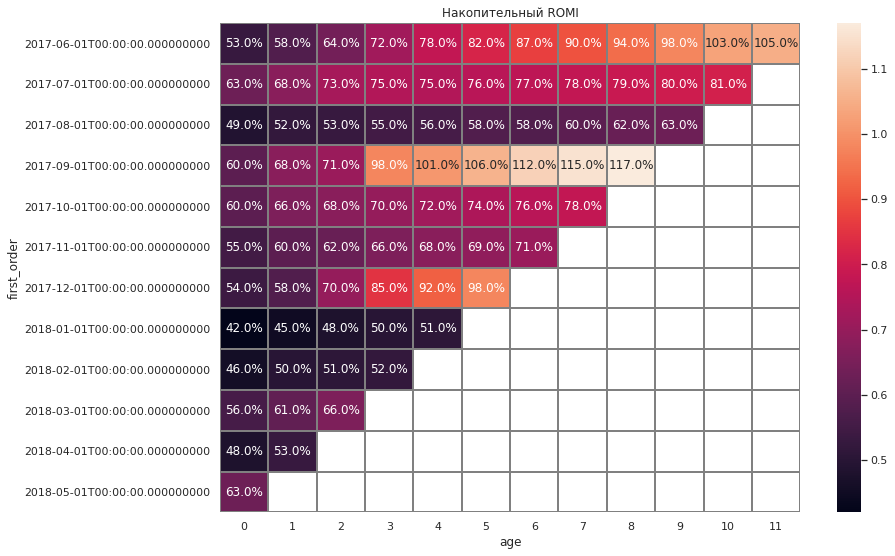

In [69]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Накопительный ROMI')
sns.heatmap(output.cumsum(axis=1).round(2), annot=True, fmt='.1%', linewidths=1, linecolor='gray'); 

По накопительному ROMI хорошо себя показывают когорты Июня, Сентября и Декабря.

__CAC по источнику__

Определим для каждого пользователя его первый источник

In [70]:
#Отсортируем по дате и времени первой сессии
visits_sorted = visits.sort_values(by='Start Ts')
#сгруппируем по uid и выберем первый источник
user_first_source = visits_sorted.groupby('Uid').agg({'Source Id':'first'})
user_first_source.head()

,Source Id
Uid,
11863502262781,3
49537067089222,2
297729379853735,3
313578113262317,2
325320750514679,5


По таблице заказов определим выручку каждого источника

In [71]:
#к таблице заказов добавим источник
orders_by_source = orders.merge(user_first_source, on='Uid')
#посчитаем выручку по источникам
rev_by_source = orders_by_source.groupby('Source Id').agg({'Revenue': 'sum'}).reset_index().rename(columns={'Source Id':'source_id', 'Revenue':'source_revenue'})
rev_by_source

,source_id,source_revenue
0,1,31090.55
1,2,46923.61
2,3,54511.24
3,4,56696.83
4,5,52624.02
5,7,1.22
6,9,5759.40
7,10,4450.33


Определим количество человек, посетивших сайт по каждому источнику

In [72]:
visit_by_source = visits.groupby('Source Id').agg({'Uid':'nunique'}).reset_index().rename(columns={'Source Id':'source_id', 'Uid':'source_visit'})
visit_by_source

,source_id,source_visit
0,1,18999
1,2,26245
2,3,74756
3,4,83525
4,5,56974
5,6,6
6,7,34
7,9,9264
8,10,8067


Определим количество человек, оформивших заказ по каждому источнику

In [73]:
client_by_source = orders_by_source.groupby('Source Id').agg({'Uid':'nunique'}).reset_index().rename(columns={'Source Id':'source_id', 'Uid':'source_buyer'})
client_by_source

,source_id,source_buyer
0,1,2899
1,2,3506
2,3,10473
3,4,10296
4,5,6931
5,7,1
6,9,1088
7,10,1329


In [74]:
costs_by_source = costs_by_source.reset_index().rename(columns={'Source Id':'source_id', 'costs':'source_costs'})
costs_by_source

,source_id,source_costs
0,1,20833.27
1,2,42806.04
2,3,141321.63
3,4,61073.60
4,5,51757.10
5,9,5517.49
6,10,5822.49


In [75]:
#Собираем данные в одну таблицу (визиты, покупки, выручка и расходы по источнику)
all_by_source = visit_by_source.merge(client_by_source, on = 'source_id')
all_by_source = all_by_source.merge(rev_by_source, on = 'source_id')
all_by_source = all_by_source.merge(costs_by_source, on = 'source_id')
all_by_source

,source_id,source_visit,source_buyer,source_revenue,source_costs
0,1,18999,2899,31090.55,20833.27
1,2,26245,3506,46923.61,42806.04
2,3,74756,10473,54511.24,141321.63
3,4,83525,10296,56696.83,61073.60
4,5,56974,6931,52624.02,51757.10
5,9,9264,1088,5759.40,5517.49
6,10,8067,1329,4450.33,5822.49


In [76]:
all_by_source['cac'] = (all_by_source['source_costs']/all_by_source['source_buyer']).round(2)
all_by_source.sort_values(by = 'cac', ascending = False)

,source_id,source_visit,source_buyer,source_revenue,source_costs,cac
2,3,74756,10473,54511.24,141321.63,13.49
1,2,26245,3506,46923.61,42806.04,12.21
4,5,56974,6931,52624.02,51757.10,7.47
0,1,18999,2899,31090.55,20833.27,7.19
3,4,83525,10296,56696.83,61073.60,5.93
5,9,9264,1088,5759.40,5517.49,5.07
6,10,8067,1329,4450.33,5822.49,4.38


In [77]:
margin_rate = 1
all_by_source['gp'] = all_by_source['source_revenue'] * margin_rate
all_by_source['ltv'] = all_by_source['gp'] / all_by_source['source_buyer']
all_by_source['romi'] = all_by_source['ltv'] / all_by_source['cac']
all_by_source

,source_id,source_visit,source_buyer,source_revenue,source_costs,cac,gp,ltv,romi
0,1,18999,2899,31090.55,20833.27,7.19,31090.55,10.724577,1.491596
1,2,26245,3506,46923.61,42806.04,12.21,46923.61,13.383802,1.096134
2,3,74756,10473,54511.24,141321.63,13.49,54511.24,5.204931,0.385836
3,4,83525,10296,56696.83,61073.60,5.93,56696.83,5.506685,0.928615
4,5,56974,6931,52624.02,51757.10,7.47,52624.02,7.592558,1.016407
5,9,9264,1088,5759.40,5517.49,5.07,5759.40,5.293566,1.044096
6,10,8067,1329,4450.33,5822.49,4.38,4450.33,3.348631,0.764528


Исходя из полученных ROMI, стоит сосредоточиться на источниках, чей ROMI > 1. То есть на источниках 1, 2, 5 и 9

In [78]:
df_1=orders_by_source.groupby(
    ['Source Id','month']).agg({'Revenue':'sum', 'Uid':'nunique'}).reset_index().rename(columns={'Revenue':'monthly_rev', 'Uid':'n_buyers','Source Id':'source_id'})
df_1

,source_id,month,monthly_rev,n_buyers
0,1,2017-06-01,1378.70,190
1,1,2017-07-01,1581.68,176
2,1,2017-08-01,1441.49,128
3,1,2017-09-01,3071.61,255
4,1,2017-10-01,3621.82,376
...,...,...,...,...
81,10,2018-01-01,304.53,98
82,10,2018-02-01,338.30,134
83,10,2018-03-01,679.51,199
84,10,2018-04-01,286.50,118


In [79]:
df_2=costs.groupby(['source_id','month']).agg({'costs':'sum'}).reset_index().rename(columns={'costs':'monthly_costs'})
df_2

,source_id,month,monthly_costs
0,1,2017-06-01,1125.61
1,1,2017-07-01,1072.88
2,1,2017-08-01,951.81
3,1,2017-09-01,1502.01
4,1,2017-10-01,2315.75
...,...,...,...
79,10,2018-01-01,614.35
80,10,2018-02-01,480.88
81,10,2018-03-01,526.41
82,10,2018-04-01,388.25


In [80]:
df_3=df_2.merge(df_1, on=['source_id', 'month'])
df_3

,source_id,month,monthly_costs,monthly_rev,n_buyers
0,1,2017-06-01,1125.61,1378.70,190
1,1,2017-07-01,1072.88,1581.68,176
2,1,2017-08-01,951.81,1441.49,128
3,1,2017-09-01,1502.01,3071.61,255
4,1,2017-10-01,2315.75,3621.82,376
...,...,...,...,...,...
79,10,2018-01-01,614.35,304.53,98
80,10,2018-02-01,480.88,338.30,134
81,10,2018-03-01,526.41,679.51,199
82,10,2018-04-01,388.25,286.50,118


In [81]:
df_3['gp'] = df_3['monthly_rev'] * margin_rate
df_3['ltv'] = df_3['gp'] / df_3['n_buyers']
df_3['cac'] = df_3['monthly_costs']/df_3['n_buyers']
df_3['romi'] = df_3['ltv'] / df_3['cac']
df_3

,source_id,month,monthly_costs,monthly_rev,n_buyers,gp,ltv,cac,romi
0,1,2017-06-01,1125.61,1378.70,190,1378.70,7.256316,5.924263,1.224847
1,1,2017-07-01,1072.88,1581.68,176,1581.68,8.986818,6.095909,1.474238
2,1,2017-08-01,951.81,1441.49,128,1441.49,11.261641,7.436016,1.514472
3,1,2017-09-01,1502.01,3071.61,255,3071.61,12.045529,5.890235,2.045000
4,1,2017-10-01,2315.75,3621.82,376,3621.82,9.632500,6.158910,1.563994
...,...,...,...,...,...,...,...,...,...
79,10,2018-01-01,614.35,304.53,98,304.53,3.107449,6.268878,0.495695
80,10,2018-02-01,480.88,338.30,134,338.30,2.524627,3.588657,0.703502
81,10,2018-03-01,526.41,679.51,199,679.51,3.414623,2.645276,1.290838
82,10,2018-04-01,388.25,286.50,118,286.50,2.427966,3.290254,0.737927


In [82]:
#преобразование формата даты, чтобы на тепловой карте не отображалось нулевое время
df_3['month'] = df_3['month'].dt.strftime('%Y-%m-%d')
df_3_pivot = df_3.pivot_table(
    index='source_id', columns='month', values='romi', aggfunc='mean'
)
df_3_pivot

month,2017-06-01,2017-07-01,2017-08-01,2017-09-01,2017-10-01,2017-11-01,2017-12-01,2018-01-01,2018-02-01,2018-03-01,2018-04-01,2018-05-01
source_id,,,,,,,,,,,,
1,1.224847,1.474238,1.514472,2.045000,1.563994,1.439366,1.173915,1.168623,1.066505,2.048909,1.843057,1.700779
2,0.429962,0.801038,0.512973,0.807252,1.097377,0.879074,0.951878,0.715139,1.467367,2.006520,1.146240,1.932547
3,0.362709,0.416684,0.319843,0.467591,0.389213,0.380082,0.372736,0.318461,0.350644,0.395800,0.366502,0.526341
4,0.557596,0.816859,0.563530,0.597175,0.935110,1.325780,0.979920,0.775584,0.993732,1.137526,1.048799,1.104905
5,0.725842,0.861514,0.972754,1.155585,0.960141,0.628809,2.453589,0.737562,0.998121,0.822912,0.669283,0.695012
9,0.850887,0.784260,1.192183,1.106467,1.328367,1.066205,0.987887,0.699521,1.049048,1.410939,0.854748,1.040009
10,0.729903,0.568765,0.801866,0.426075,0.913080,0.777538,0.538058,0.495695,0.703502,1.290838,0.737927,1.233250


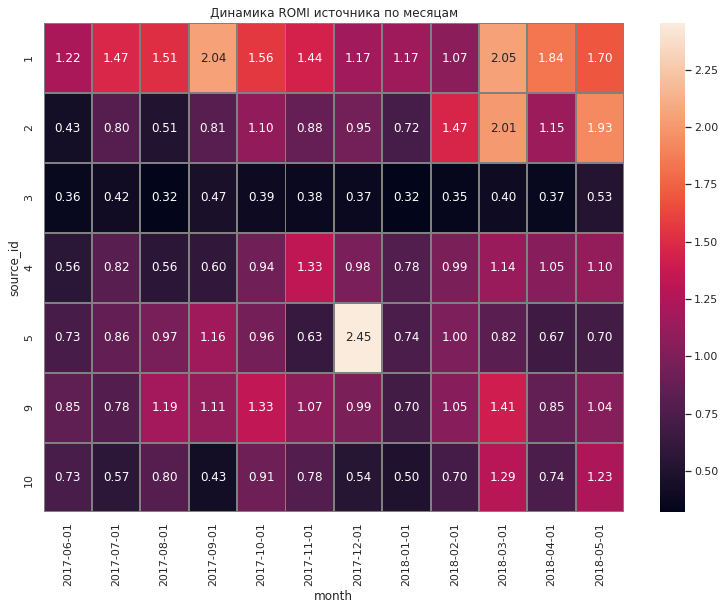

In [83]:
sns.set(style='white')

plt.figure(figsize=(13, 9))
plt.title('Динамика ROMI источника по месяцам')
sns.heatmap(df_3_pivot, annot=True, fmt='.2f', linewidths=1, linecolor='gray');

По месячной динамике ROMI источника - Источник 1 - окупается каждый месяц. Источник 3 - не окупился ни в один месяц. Так же можно выделить Источник 9, он окупался 7 месяцев из 12.

## Выводы

__Продуктовые метрики__
- Среднее значение DAU за весь период: 907
- Среднее значение WAU за весь период: 5716
- Среднее значение MAU за весь период: 23228
- Среднее количество посещений в день: 987
- Средняя длина пользовательской сессии 643 секунд(а)
- Наиболее часто встречаемое значение длины сессии 60 секунд
- В месяц один пользователь в среднем проводит 1.28 сессии. Получается, примерно, что один из четырех пользвателей заходит на сайт два раза в месяц
- Retention Rate очень маленький, cредний Retention Rate на второй месяц «жизни» когорт: 4.63%

__Метрики электронной комерции__
- Среднее время с момента первого посещения до первой покупки: 4.15 ч.
- Наиболее часто встречаемое время от первого посещения до покупки: 60 секунд. То есть зашёл - купил.
- Среднее количество покупок за 6 месяцев: 6

__Маркетинговые метрики__
- Самый затратный источник №3. На него уходит больше всего расходов и у него маленькая окупаемость. Стоит присмотреться к истоникам 1, 2, 5 и 9, так как их ROMI > 1
- По накопительному ROMI хорошо себя показывают когорты Июня, Сентября и Декабря.